Project 3: A Neural Network Classifier, Tuned.
This assignment continues our treatment of supervised machine learning, in particular now using Neural Network (NN) models. In essense you will be experimenting with training and validation of NNs, and benchmarking against k-Nearest Neighbors (kNN) on the male/female voice dataset from Hand-in Assignment 2.

You will be choosing a matrix of hyperparameters and network topologies (layers, activation functions, etc), to test convergence and confusion statistics for both kNNs and NNs during this project.

Perhaps go above and beyond to check the basic NN concepts. You should look into, particularly, MLPs and deep NN topologies (how many layers, what kind, etc.), drop-out rates, activation functions, training convergence.

Part 0: Business Case
The voice dataset from Kaggle is interesting in the sense that it is an extremely straigforward way to hook up to a telephone and label all calls to devices fx. No data is kept, no personal sensititve information needs to be recorded but the information could be valuable. Are one or the other gender, or both, or none, more prone to seek medical assitance during springtime? Perhaps a bit farfetched, but it serves the purpose of playing "business case".

Hand in a few paragraphs with some more thoughts on possible business cases. Could we treat streaming data with these simple models only adding a bit of data preprocessing from audio streams? Or something else?

Part 1: Data Exploration & Preparation -- Revisited
You have already worked on this part. Still, a few very interesting points were brought up in classroom discussions this week. Again, your job is to identify potential problems and potential optimizations on feature space, and the labels that you're predicting.

Look into the following a bit more elaborately:

Download the voice.csv data and explore.
Do we see correlations in feature space?
If any: are they true/justifiable correlations (or anti-correlations)?
If so, should -- or could -- we remove/discard features from our work with the NN and kNN models?
Are there scaling issues w.r.t. feature ratios (fx a=[-.03,0.74], b=[-20000.,9999.])?
Highly skewed distributions (mean, standard deviation, skewness, kurtosis ...)?
Hand in 2 pages describing your data wrangling, and your investigation on feature correlations. Show that you understand what correlation, un-correlation and anti-correlation is. Some reasoning as to why some might be correlated while others are un-correlated. Include code/plots, whatever is needed to understand your work you answer.

Part 2: Model construction
We will use two models: Neural Networks and k-Nearest Neighbours. Both model classes shall be used as binary classifiers on the voice.csv data from Kaggle. The interesting thing to test is of course whether kNN does better or worse or the same as NNs.

Part 2.1: k-Nearest Neighbours
Runs out-of-the-box, but you should consider all variable aspects of the algorithm, start with scikit-learn docs, and the question of hyperparam(s?).

Part 2.2: Keras Neural Networks
The new interesting part of the this project concerns Neural Networks. Code up a network similar to what was demonstrated during lectures, week 12, namely in 'Predicting with NN.ipynb'.

Hand in the code for constructing and varying the topology of the NN, and your reasoning behind the chosen construction of the NN and the kNN. Include a one-pager explaining any detail that you deem valuable to discuss.

Part 3: Model Training and Validation, Hyperparameter Grid Search
Model Training and Validation
We need to experiment with our models -- how the models were trained and validated. How did you use your data for training, based on your observations in Part 1 above?

Excluded/included features?
Experimentation with the curse of dimensionality?
80/20, 50/50, or other, splitting?
Splits: stratified, random, ...?
did you do ensemble learning like bagging, boosting?
You should experiment with your training on:

the data set, with labels as-is (balanced data)
an un-balanced data set, e.g. remove 60% of the male cases..
an re-balanced data set, where you have oversampled your un-balanced data with the SMOTE technique.
You should vary parameters for the Neural Network, investigating how changing the NN affects its performance. So, vary fx:

Network topology
number of layers, number of neurons
Activation functions, Biases, Network Initialization, Dropout rates
You should produce adequate metrics, and accompanying plots:
Confusion matrix
Accuracy/Precision/Recall
ROC curve, Prec-Recall curve: ROC or P-R? Remember all that fuzz with balanced data sets...
Hand in thorough reporting on your choices of:

features, from correlation studies in Part 1, and some common sense
training and validation splits. If applicable: bagging/boosting/ensemble learning
experiments with un-/re-/balanced datasets.
network topologies as of Part 2 and Part 3.2 above.
metrics, and how metrics are influenced by un-balancing/re-balancing the dataset
NB: Your reasoning behind those choices and the outcomes is in focus here. Include sufficient plots and numbers to support your conclusions on the training/validtion.

Hyperparameter Grid Search
The hyperparameter search is given by the kNN and NN parameter input and the NNs' topologies. Choose a reasonable range of parameters, making sure that you cover a good portion of the relevant parameter space.

Hand in your hyperparameter grid as a table per model (or several tables if needed). Include in the tables figures of performance of kNN and NN for your choices of tuning params. NB: the 'score' output may not be sufficient.

Part 4: The 5-feature Challenge
This is a test of your ability to combine Parts 1-3 from above into one single objective:

Optimize your models, using only 5 features.
Hand in a list of your favorite 5 features, meaning those features that give you the best performance, and that arguably are the most important 5 features. Hand in a two-page report with explanation and argument for your choices.

In [1]:
#part 0
#autamated hotlines
#syntisering tonelejet. 
# investigate which features to impact the sensitivity in voices whether it is a male or female.

## Part 0
### Automated hotlines
### Synthezising tone
### Investigate which features to impact the sensitivity in voices whether it is a male or female.
### Health eg. throat cancer
### Streaming will depend on the hardware.To increase model speed we could decrease the 
### number of features.

## Part 1

In [2]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

C:\Users\yosuke\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
df = pd.read_csv("voice.csv")

In [4]:
# describe the descripe/ description missing

In [5]:
df.describe()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,0.165282,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,0.077203,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,0.118016,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,0.186599,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,0.221104,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


In [6]:
df.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [7]:
#x = df.iloc[:, 0:20].values
#y = df['label']
#label = LabelEncoder()
#y = label.fit_transform(y)
df['label']=LabelEncoder().fit_transform(df['label'])
col = df.columns

### To visualize the correlation we are using correlation diagram shown below. The closer the numbers are to 1 or -1 the more correlated and anti-correlated the features are. Which means that the higher numbers (closer to 1 or lower number closer to -1) is correlations in features space. 

In [9]:
sns.pairplot(df[col],size=5, hue="label")
plt.tight_layout()
plt.show()

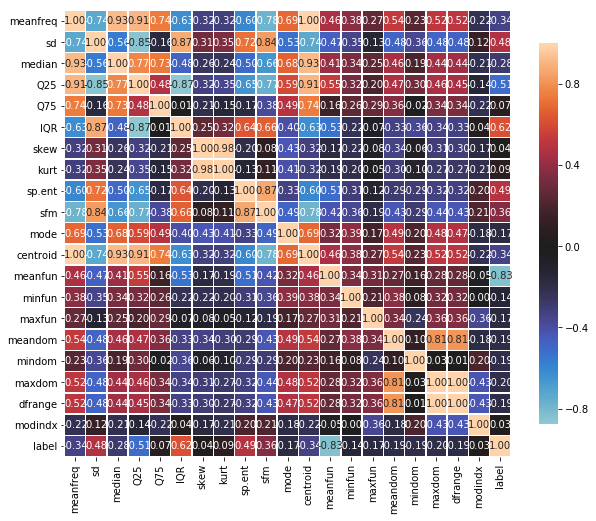

In [10]:
#NB only visible when executing inside jupyter notebook not in github 

def correlation_heatmap(df):
    correlations = df.corr()

    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f',
                square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
    plt.show();
    
correlation_heatmap(df)

## There is a 0.98 high correlation rate between skew and kurt. A true justification of whether to discard the 2 features cannot be made, as there lacks a comprehensive description about the features that we are able to possess. Most likely we could remove the features without impacting the models. But we will examine this in greater details below.   

## Without removing kurt and skew there are considerbly scaling issues in that they are a factor of thousands, which will result in wrong scaling ratio. 

## As an experiment we wanted to investigate which of the features has the biggest influence on the label. We did this by dividing the features into male and female, and then calculating which features had the biggest impact on the label. By looking at the result we can determind that IQR had the highest number closest to 1. 

In [51]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [52]:
model_lr = LogisticRegression()
model_knn = KNeighborsClassifier()

In [53]:
x = df.iloc[:, 0:20].values
y = df['label']

#scaler = StandardScaler()
#scaler.fit(x,y)

x_train,x_test,y_train, y_test = train_test_split(x, y , test_size=0.2, random_state=42)

In [54]:
m = model_knn.fit(x_train, y_train)

In [55]:
m.score(x_train, y_train)

0.8101815311760063

In [56]:
y_pred = model_knn.predict(x_test)

In [57]:
accuracy_score(y_test, y_pred)

0.7050473186119873

In [38]:
#male
newdataframe = df
newdataframe['label']=LabelEncoder().fit_transform(newdataframe['label'])
dfLabelcorrelationMale = newdataframe[newdataframe.iloc[0:1584,:].columns[0:]].corr()['label']

#female
dfLabelcorrelationFemale = newdataframe[newdataframe.iloc[1585:3168,:].columns[0:]].corr()['label']


## The 2 calculations show that the correlations between the 2 features are identical, we do not belive this results, so either our method is wrong or this type of correlation is not ment to be calculated this way. 

In [39]:
dfLabelcorrelationFemale

meanfreq   -0.337415
sd          0.479539
median     -0.283919
Q25        -0.511455
Q75         0.066906
IQR         0.618916
skew        0.036627
kurt        0.087195
sp.ent      0.490552
sfm         0.357499
mode       -0.171775
centroid   -0.337415
meanfun    -0.833921
minfun     -0.136692
maxfun     -0.166461
meandom    -0.191067
mindom     -0.194974
maxdom     -0.195657
dfrange    -0.192213
modindx     0.030801
label       1.000000
Name: label, dtype: float64

In [40]:
dfLabelcorrelationMale

meanfreq   -0.337415
sd          0.479539
median     -0.283919
Q25        -0.511455
Q75         0.066906
IQR         0.618916
skew        0.036627
kurt        0.087195
sp.ent      0.490552
sfm         0.357499
mode       -0.171775
centroid   -0.337415
meanfun    -0.833921
minfun     -0.136692
maxfun     -0.166461
meandom    -0.191067
mindom     -0.194974
maxdom     -0.195657
dfrange    -0.192213
modindx     0.030801
label       1.000000
Name: label, dtype: float64

## Part 2

In [45]:
from sklearn.model_selection import train_test_split
from scipy.stats import pearsonr

In [50]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input
from tensorflow.keras.layers import Activation
from tensorflow.keras.optimizers import Adam

In [51]:
# This model has one input layer and one output layer, dropout 20% of the data.
model = models.Sequential([
    layers.Dense(20, activation='relu', input_shape=(20,)),
    layers.Dropout(0.2),
    layers.Dense(2, activation='softmax')
])

In [52]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 20)                420       
_________________________________________________________________
dropout (Dropout)            (None, 20)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 42        
Total params: 462
Trainable params: 462
Non-trainable params: 0
_________________________________________________________________


In [53]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [56]:
x_train,x_test,y_train, y_test = train_test_split(x, y , test_size=0.2, random_state=42)

In [58]:
model.fit(x_train, y_train, epochs = 100)

Epoch 1/100
2534/2534 [==============================] - 1s 282us/step - loss: 1.4936 - acc: 0.5130
Epoch 2/100
2534/2534 [==============================] - 0s 60us/step - loss: 1.3676 - acc: 0.5359
Epoch 3/100
2534/2534 [==============================] - 0s 55us/step - loss: 1.2256 - acc: 0.5651
Epoch 4/100
2534/2534 [==============================] - 0s 55us/step - loss: 1.0643 - acc: 0.5624
Epoch 5/100
2534/2534 [==============================] - 0s 54us/step - loss: 1.0500 - acc: 0.5781
Epoch 6/100
2534/2534 [==============================] - 0s 55us/step - loss: 1.0063 - acc: 0.5762
Epoch 7/100
2534/2534 [==============================] - 0s 54us/step - loss: 0.9174 - acc: 0.6085
Epoch 8/100
2534/2534 [==============================] - 0s 54us/step - loss: 0.8762 - acc: 0.6302
Epoch 9/100
2534/2534 [==============================] - 0s 55us/step - loss: 0.8996 - acc: 0.6310
Epoch 10/100
2534/2534 [==============================] - 0s 54us/step - loss: 0.8034 - acc: 0.6559
Epoch 11

In [59]:
model.evaluate(x_test, y_test)

634/634 [==============================] - 0s 145us/step


[0.1808774586449662, 0.9589905362776026]

In [63]:
# new model with additional hidden layers
model_hiddenlayer = models.Sequential([
    layers.Dense(20, activation='relu', input_shape=(20,)),
    layers.Dropout(0.2),
    layers.Dense(20, activation='relu', input_shape=(20,)),
    layers.Dense(2, activation='softmax')
])

In [64]:
model_hiddenlayer.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [65]:
model_hiddenlayer.fit(x_train, y_train, epochs = 100)

Epoch 1/100
2534/2534 [==============================] - 1s 275us/step - loss: 1.1669 - acc: 0.5403
Epoch 2/100
2534/2534 [==============================] - 0s 61us/step - loss: 0.9941 - acc: 0.5651
Epoch 3/100
2534/2534 [==============================] - 0s 62us/step - loss: 0.9785 - acc: 0.5742
Epoch 4/100
2534/2534 [==============================] - 0s 61us/step - loss: 0.8813 - acc: 0.5971
Epoch 5/100
2534/2534 [==============================] - 0s 61us/step - loss: 0.8224 - acc: 0.6294
Epoch 6/100
2534/2534 [==============================] - 0s 63us/step - loss: 0.7921 - acc: 0.6547
Epoch 7/100
2534/2534 [==============================] - 0s 64us/step - loss: 0.7315 - acc: 0.6677
Epoch 8/100
2534/2534 [==============================] - 0s 65us/step - loss: 0.7493 - acc: 0.6594
Epoch 9/100
2534/2534 [==============================] - 0s 64us/step - loss: 0.7121 - acc: 0.6930
Epoch 10/100
2534/2534 [==============================] - 0s 63us/step - loss: 0.6897 - acc: 0.6953
Epoch 11

In [66]:
model_hiddenlayer.evaluate(x_test, y_test)

634/634 [==============================] - 0s 181us/step


[0.1373274720946697, 0.9652996845425867]

In [ ]:
from sklearn.metrics import confusion_matrix


pipeline_knn.fit(x_train, y_train)
y_pred = pipeline_knn.predict(x_test)
confmat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print(confmat)

fig, ax = plt.subplots(figsize=(2.5, 2.5))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i,
                s=confmat[i, j],
                va='center', ha='center')

        plt.xlabel('predicted label')
plt.ylabel('true label')
plt.show()

